In [1]:
! pip install rarfile
! pip install tensorflow
! pip install keras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import rarfile

rar = rarfile.RarFile('/content/Bird Speciees Dataset.rar')
rar.extractall('Bird_Speciees_Dataset')


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.image import imread 
import seaborn as sns
from os import listdir
import cv2
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing import image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense


In [4]:
! pip install keras --upgrade


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import callbacks

In [6]:
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img


In [7]:
path ='/content/Bird_Speciees_Dataset/Bird Speciees Dataset/AMERICAN GOLDFINCH'

In [8]:
listdir(path)

['094.jpg',
 '024.jpg',
 '001.jpg',
 '063.jpg',
 '105.jpg',
 '059.jpg',
 '036.jpg',
 '107.jpg',
 '087.jpg',
 '012.jpg',
 '033.jpg',
 '035.jpg',
 '049.jpg',
 '131.jpg',
 '102.jpg',
 '014.jpg',
 '046.jpg',
 '010.jpg',
 '140.jpg',
 '006.jpg',
 '108.jpg',
 '092.jpg',
 '026.jpg',
 '042.jpg',
 '118.jpg',
 '089.jpg',
 '127.jpg',
 '124.jpg',
 '007.jpg',
 '061.jpg',
 '037.jpg',
 '100.jpg',
 '045.jpg',
 '013.jpg',
 '051.jpg',
 '091.jpg',
 '136.jpg',
 '110.jpg',
 '096.jpg',
 '074.jpg',
 '017.jpg',
 '084.jpg',
 '023.jpg',
 '066.jpg',
 '106.jpg',
 '132.jpg',
 '019.jpg',
 '004.jpg',
 '141.jpg',
 '048.jpg',
 '081.jpg',
 '114.jpg',
 '062.jpg',
 '093.jpg',
 '083.jpg',
 '027.jpg',
 '125.jpg',
 '123.jpg',
 '041.jpg',
 '133.jpg',
 '056.jpg',
 '011.jpg',
 '122.jpg',
 '128.jpg',
 '072.jpg',
 '054.jpg',
 '090.jpg',
 '115.jpg',
 '113.jpg',
 '052.jpg',
 '064.jpg',
 '085.jpg',
 '016.jpg',
 '025.jpg',
 '070.jpg',
 '015.jpg',
 '032.jpg',
 '076.jpg',
 '143.jpg',
 '109.jpg',
 '137.jpg',
 '120.jpg',
 '099.jpg',
 '07

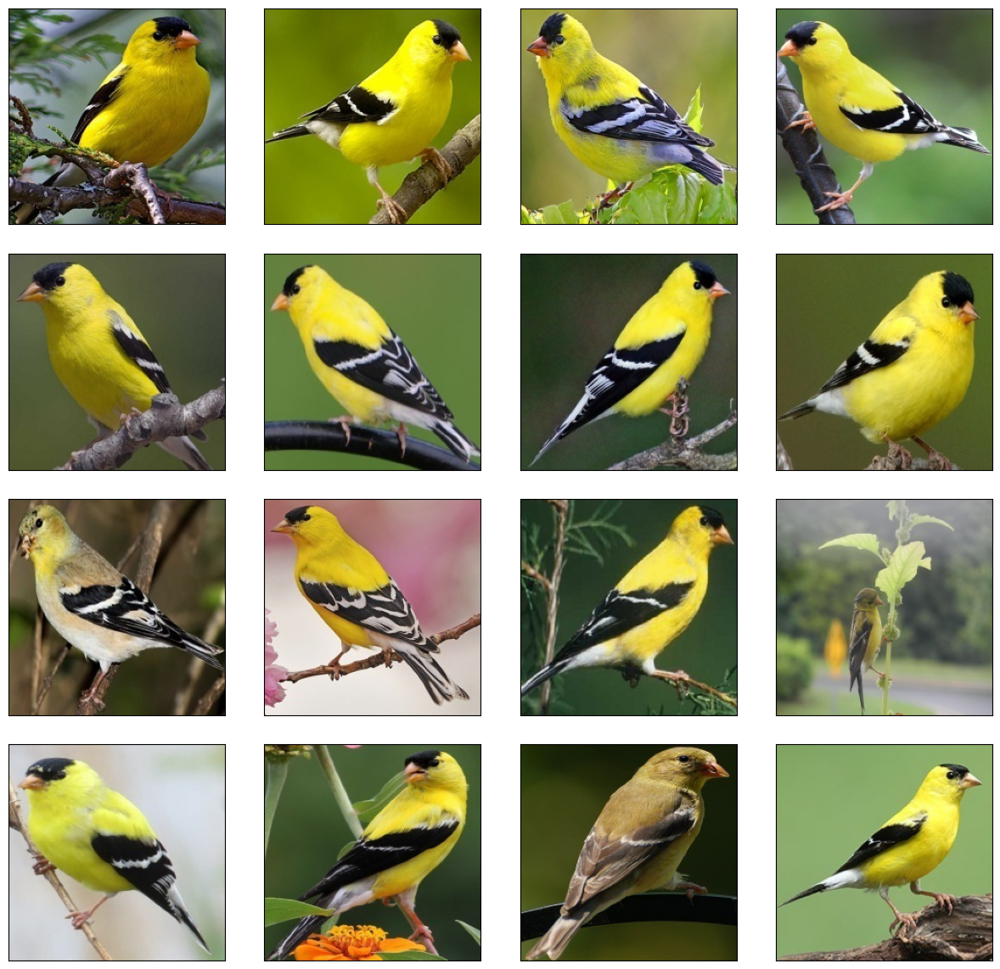

In [9]:
plt.figure(figsize=(12,12))
for i in range (1,17):
  path ='/content/Bird_Speciees_Dataset/Bird Speciees Dataset/AMERICAN GOLDFINCH'
  plt.subplot(4,4,i)
  plt.tight_layout()
  rand_img= imread(path +'/'+ random.choice(sorted(listdir(path))))
  plt.imshow(rand_img)
  plt.xticks([])
  plt.yticks([])

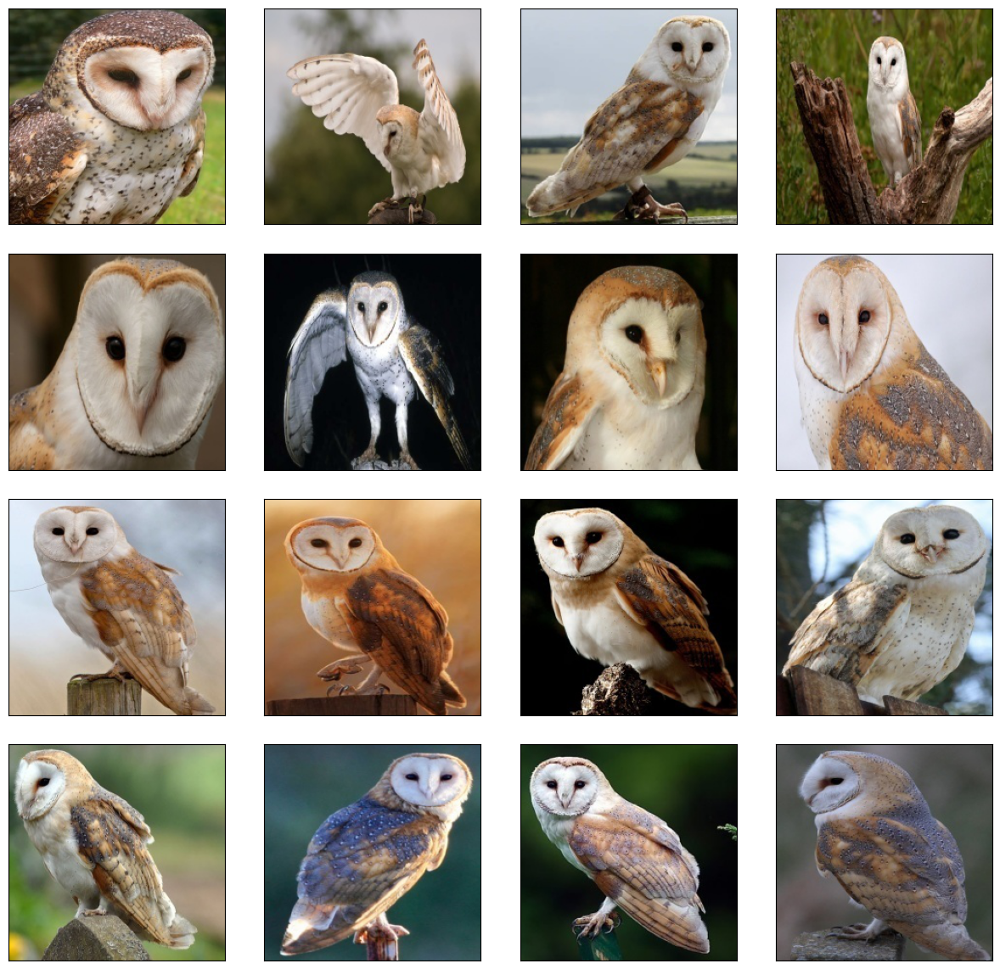

In [10]:
plt.figure(figsize=(12,12))
for i in range (1,17):
  path ='/content/Bird_Speciees_Dataset/Bird Speciees Dataset/BARN OWL'
  plt.subplot(4,4,i)
  plt.tight_layout()
  rand_img= imread(path +'/'+ random.choice(sorted(listdir(path))))
  plt.imshow(rand_img)
  plt.xticks([])
  plt.yticks([])

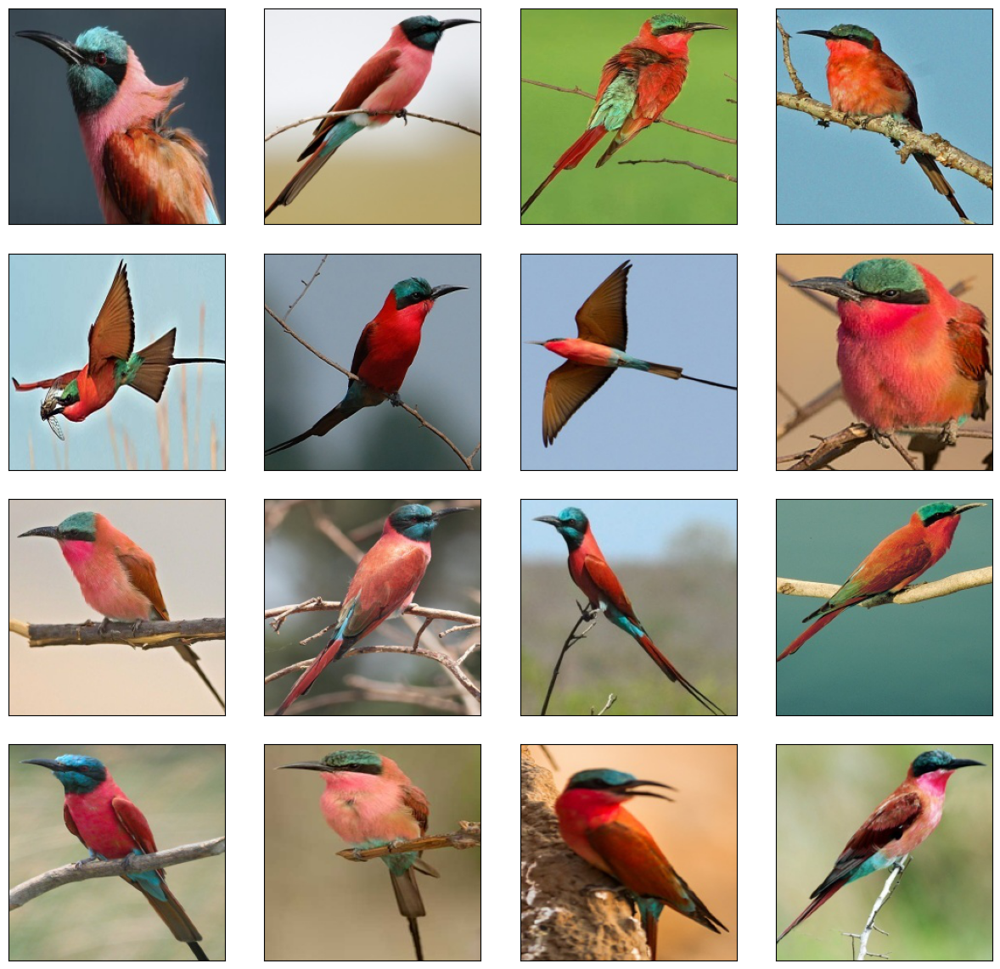

In [11]:
plt.figure(figsize=(12,12))
for i in range (1,17):
  path ='/content/Bird_Speciees_Dataset/Bird Speciees Dataset/CARMINE BEE-EATER'
  plt.subplot(4,4,i)
  plt.tight_layout()
  rand_img= imread(path +'/'+ random.choice(sorted(listdir(path))))
  plt.imshow(rand_img)
  plt.xticks([])
  plt.yticks([])

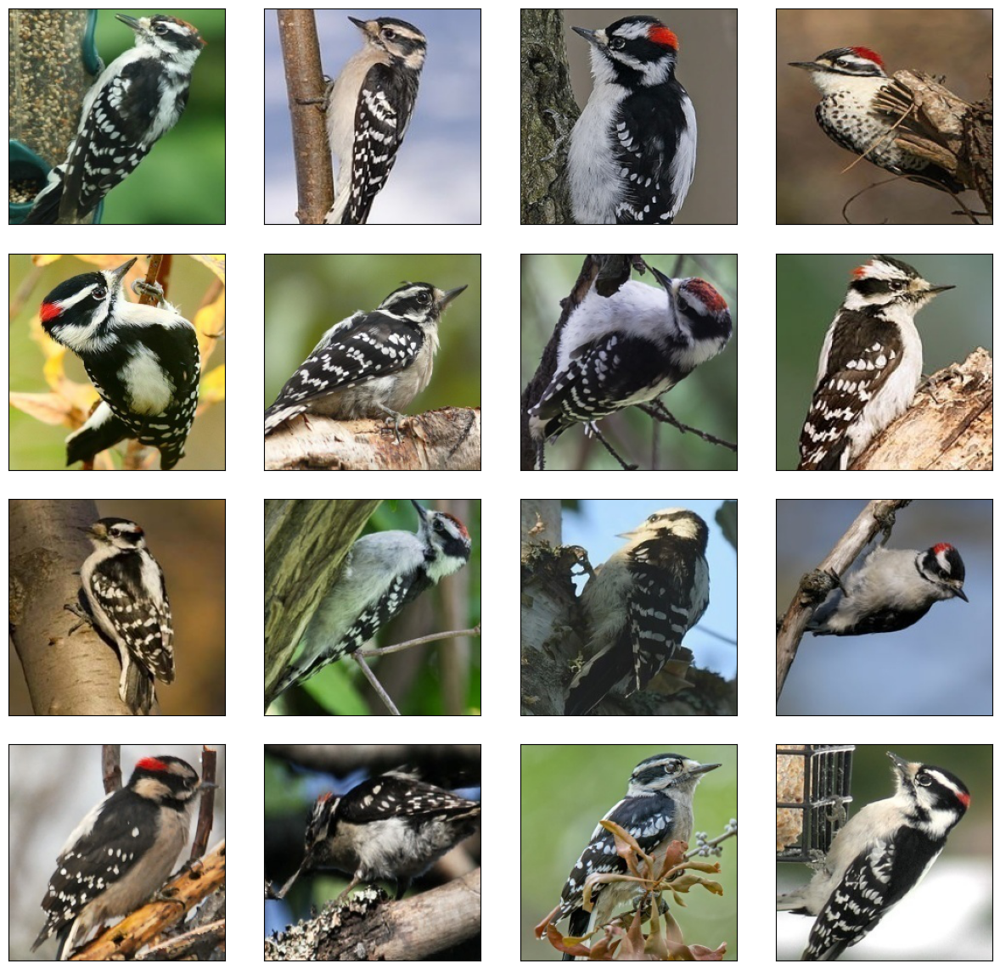

In [12]:
plt.figure(figsize=(12,12))
for i in range (1,17):
  path ='/content/Bird_Speciees_Dataset/Bird Speciees Dataset/DOWNY WOODPECKER'
  plt.subplot(4,4,i)
  plt.tight_layout()
  rand_img= imread(path +'/'+ random.choice(sorted(listdir(path))))
  plt.imshow(rand_img)
  plt.xticks([])
  plt.yticks([])

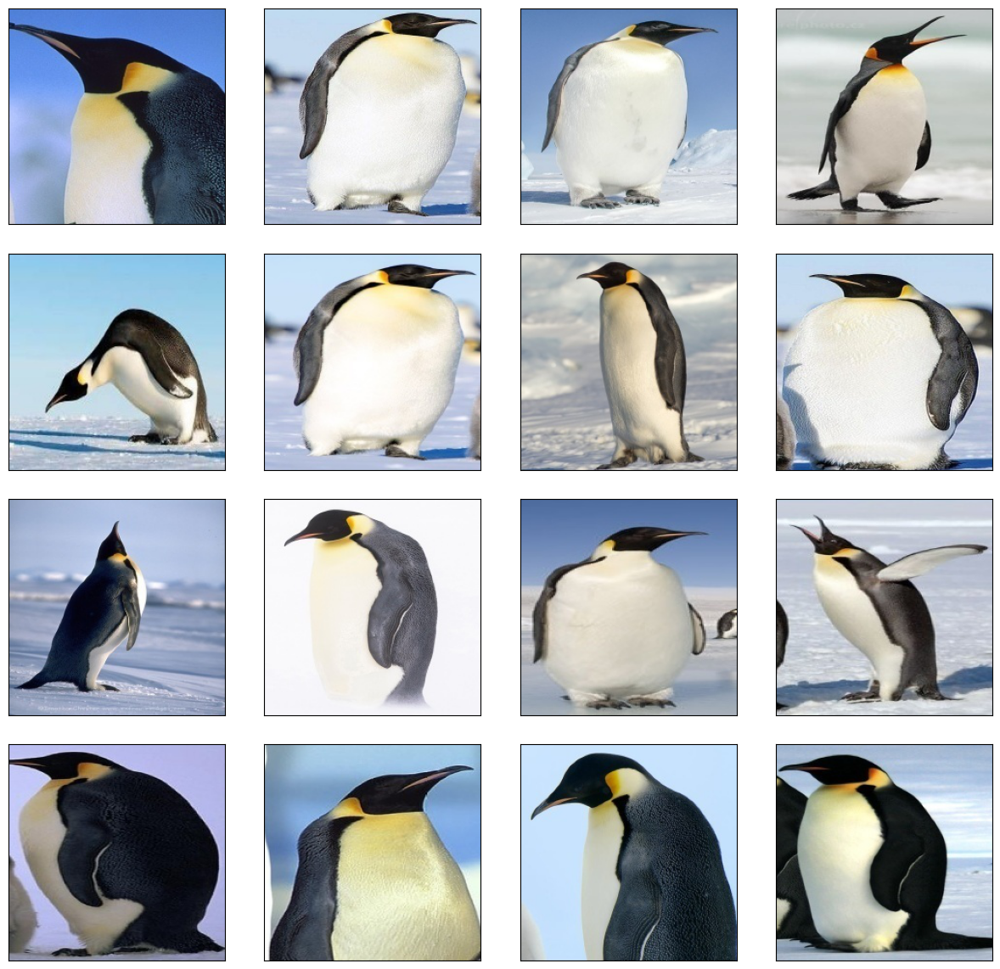

In [13]:
plt.figure(figsize=(12,12))
for i in range (1,17):
  path ='/content/Bird_Speciees_Dataset/Bird Speciees Dataset/EMPEROR PENGUIN'
  plt.subplot(4,4,i)
  plt.tight_layout()
  rand_img= imread(path +'/'+ random.choice(sorted(listdir(path))))
  plt.imshow(rand_img)
  plt.xticks([])
  plt.yticks([])

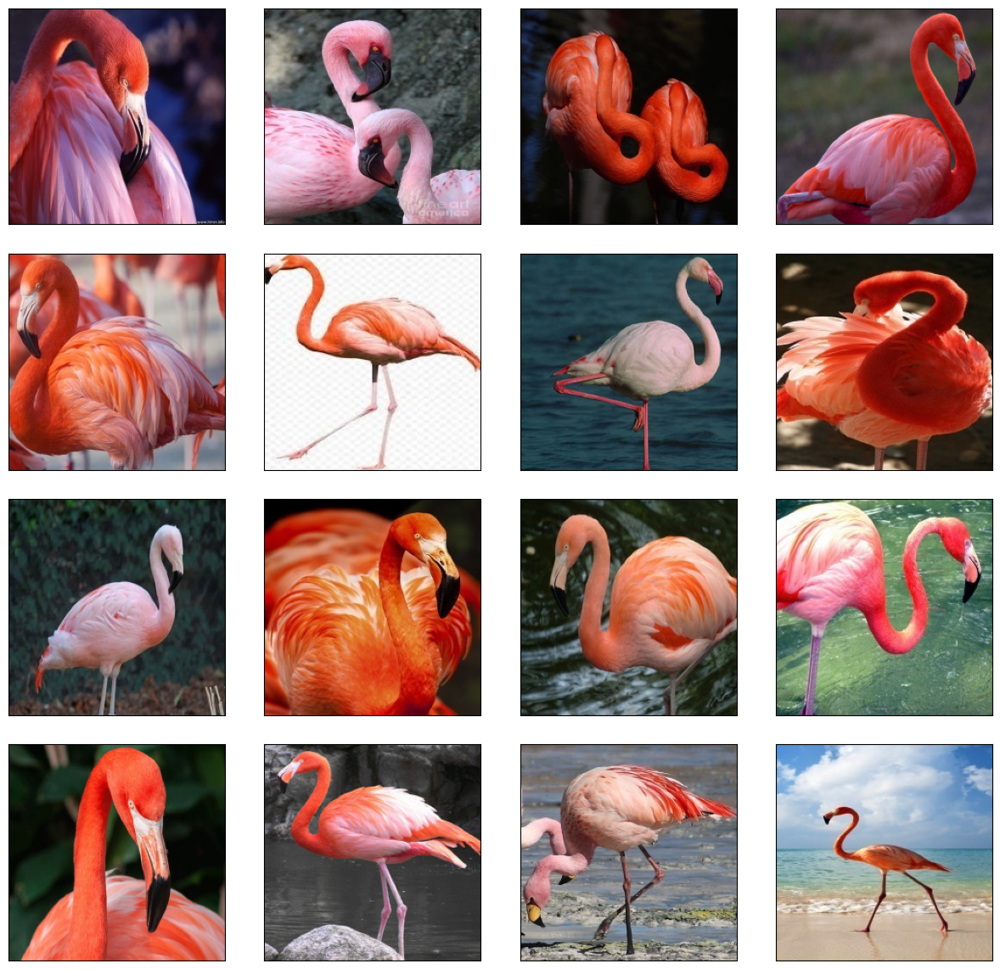

In [14]:
plt.figure(figsize=(12,12))
for i in range (1,17):
  path ='/content/Bird_Speciees_Dataset/Bird Speciees Dataset/FLAMINGO'
  plt.subplot(4,4,i)
  plt.tight_layout()
  rand_img= imread(path +'/'+ random.choice(sorted(listdir(path))))
  plt.imshow(rand_img)
  plt.xticks([])
  plt.yticks([])

In [15]:
import os

dir = "/content/Bird_Speciees_Dataset/Bird Speciees Dataset"
root_dir = sorted(os.listdir(dir))

image_list, label_list = [], []

for filename in root_dir:
    file_path = os.path.join(dir, filename)
    if os.path.isfile(file_path):
        image_list.append(file_path)
        label_list.append(filename)

In [16]:
root_dir

['AMERICAN GOLDFINCH',
 'BARN OWL',
 'CARMINE BEE-EATER',
 'DOWNY WOODPECKER',
 'EMPEROR PENGUIN',
 'FLAMINGO']

In [17]:
for directory in root_dir:
  for files in listdir(f"{dir}/{directory}"):
    image_path = f"{dir}/{directory}/{files}"
    image = cv2.imread(image_path)
    image = img_to_array(image)
    image_list.append(image)
    label_list.append(directory)

In [18]:
image_list[1]

array([[[44., 78., 67.],
        [45., 79., 68.],
        [47., 81., 70.],
        ...,
        [43., 78., 64.],
        [43., 78., 64.],
        [42., 77., 63.]],

       [[44., 78., 67.],
        [45., 79., 68.],
        [46., 80., 69.],
        ...,
        [44., 79., 65.],
        [43., 78., 64.],
        [43., 78., 64.]],

       [[44., 78., 67.],
        [45., 79., 68.],
        [46., 80., 69.],
        ...,
        [44., 79., 65.],
        [43., 78., 64.],
        [43., 78., 64.]],

       ...,

       [[37., 38., 36.],
        [33., 34., 32.],
        [46., 44., 43.],
        ...,
        [47., 83., 66.],
        [44., 80., 63.],
        [46., 83., 63.]],

       [[36., 37., 35.],
        [36., 37., 35.],
        [40., 41., 39.],
        ...,
        [46., 83., 63.],
        [42., 79., 59.],
        [50., 88., 66.]],

       [[39., 40., 38.],
        [42., 43., 41.],
        [41., 42., 40.],
        ...,
        [45., 82., 62.],
        [50., 88., 66.],
        [41., 79., 57.]]

In [19]:
label_list[3:6]

['AMERICAN GOLDFINCH', 'AMERICAN GOLDFINCH', 'AMERICAN GOLDFINCH']

In [20]:
labels_counts = pd.DataFrame(label_list).value_counts()
labels_counts

AMERICAN GOLDFINCH    143
EMPEROR PENGUIN       139
DOWNY WOODPECKER      137
FLAMINGO              132
CARMINE BEE-EATER     131
BARN OWL              129
dtype: int64

In [21]:
num_classes= len(labels_counts)
num_classes

6

In [22]:
image_list[0].shape

(224, 224, 3)

In [23]:
label_list= np.array(label_list)
label_list.shape

(811,)

<a id='5'></a>
# Spliting the data into Training and Testing 

In [24]:
x_train, x_test, y_train, y_test = train_test_split(image_list, label_list, test_size=0.3, random_state = 0) 

In [25]:
print(f"Number of training dataset : {len(x_train)}\nNumber of test dataset: {len(x_test)}")

Number of training dataset : 567
Number of test dataset: 244


In [26]:
#Normalize
x_train = np.array(x_train, dtype=np.float16) / 225.0
x_test = np.array(x_test, dtype=np.float16) / 225.0
x_train = x_train.reshape( -1, 224,224,3)
x_test  = x_test.reshape( -1, 224,224,3)

In [27]:
x_test[0]

array([[[1.026 , 1.045 , 0.9956],
        [1.026 , 1.045 , 0.9956],
        [1.022 , 1.049 , 1.    ],
        ...,
        [1.08  , 1.071 , 1.026 ],
        [1.084 , 1.075 , 1.031 ],
        [1.084 , 1.075 , 1.031 ]],

       [[1.026 , 1.045 , 0.9956],
        [1.026 , 1.045 , 0.9956],
        [1.022 , 1.049 , 1.    ],
        ...,
        [1.08  , 1.071 , 1.026 ],
        [1.084 , 1.075 , 1.031 ],
        [1.084 , 1.075 , 1.031 ]],

       [[1.018 , 1.04  , 1.    ],
        [1.022 , 1.045 , 1.005 ],
        [1.022 , 1.045 , 1.005 ],
        ...,
        [1.075 , 1.066 , 1.031 ],
        [1.08  , 1.071 , 1.035 ],
        [1.08  , 1.071 , 1.035 ]],

       ...,

       [[1.071 , 1.094 , 1.084 ],
        [1.08  , 1.103 , 1.094 ],
        [1.084 , 1.106 , 1.098 ],
        ...,
        [0.858 , 0.871 , 0.8623],
        [1.08  , 1.094 , 1.084 ],
        [1.066 , 1.08  , 1.071 ]],

       [[1.084 , 1.098 , 1.089 ],
        [1.098 , 1.111 , 1.103 ],
        [1.106 , 1.12  , 1.111 ],
        .

In [28]:
# Label binarizing to one hot encode the target variables
lb = LabelBinarizer()
y_train = lb.fit_transform(y_train)
y_test = lb.fit_transform(y_test)
print(lb.classes_)

['AMERICAN GOLDFINCH' 'BARN OWL' 'CARMINE BEE-EATER' 'DOWNY WOODPECKER'
 'EMPEROR PENGUIN' 'FLAMINGO']


In [29]:
y_train

array([[0, 1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0],
       ...,
       [0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 1]])

In [30]:
y_train.shape


(567, 6)

# **ANN**

In [31]:
def load_model(): 
    model = Sequential([
        Flatten(input_shape=(224,224,3)),
        Dense(512, activation ='relu'),
        Dense(256, activation ='relu'),
        Dense(128, activation ='relu'),
        Dense(num_classes, activation='softmax'),
    ])
    model.compile(
        optimizer= Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc'],
    )
    return model
    
    
early_stopping = callbacks.EarlyStopping(
        patience=10,
        min_delta=0,
        monitor='val_loss',
        restore_best_weights=True,
        verbose=0,
        mode='min', 
        baseline=None,
    )
plateau = callbacks.ReduceLROnPlateau(
            monitor='val_loss', 
            factor=0.2, 
            patience=4, 
            verbose=0,
            mode='min')

ann_model = load_model()
history_ann = ann_model.fit(  x_train , y_train,
                validation_data = (x_test , y_test),
                epochs = 1000,
                callbacks = [early_stopping , plateau],
              )

Epoch 1/1000
18/18 [==============================] - 29s 1s/step - loss: 30.0978 - acc: 0.1781 - val_loss: 10.8409 - val_acc: 0.2459 - lr: 5.0000e-04
Epoch 2/1000
18/18 [==============================] - 26s 1s/step - loss: 6.4903 - acc: 0.3228 - val_loss: 4.7614 - val_acc: 0.2910 - lr: 5.0000e-04
Epoch 3/1000
18/18 [==============================] - 28s 2s/step - loss: 4.6352 - acc: 0.3827 - val_loss: 2.7753 - val_acc: 0.4221 - lr: 5.0000e-04
Epoch 4/1000
18/18 [==============================] - 29s 2s/step - loss: 2.8454 - acc: 0.4850 - val_loss: 4.7274 - val_acc: 0.4303 - lr: 5.0000e-04
Epoch 5/1000
18/18 [==============================] - 26s 1s/step - loss: 2.8128 - acc: 0.5168 - val_loss: 1.8021 - val_acc: 0.5820 - lr: 5.0000e-04
Epoch 6/1000
18/18 [==============================] - 26s 1s/step - loss: 1.9276 - acc: 0.5750 - val_loss: 2.0029 - val_acc: 0.4959 - lr: 5.0000e-04
Epoch 7/1000
18/18 [==============================] - 26s 1s/step - loss: 1.4341 - acc: 0.6420 - val_los

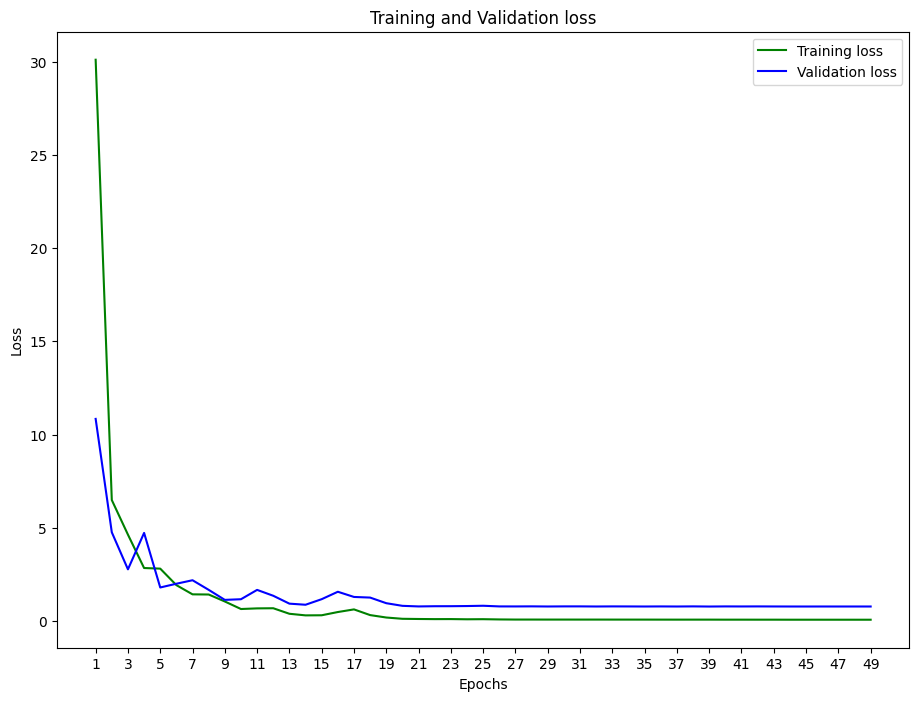

In [32]:

plt.figure(figsize=(11,8))

loss_train = history_ann.history['loss']
loss_val = history_ann.history['val_loss']
epochs = range(1, len(loss_train) + 1)  # Use the length of loss_train for the range

plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val[:len(epochs)], 'b', label='Validation loss')  # Use loss_val[:len(epochs)] to match the lengths

plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xticks(np.arange(1, len(epochs) + 1, 2))  # Use len(epochs) for the xticks range
plt.legend()
plt.show()


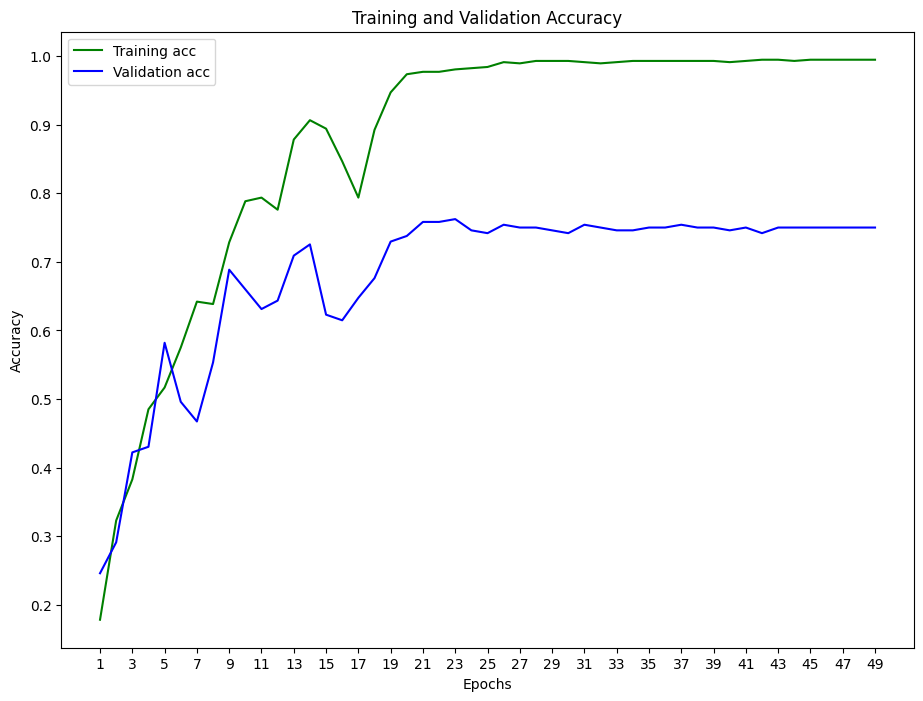

In [33]:
plt.figure(figsize=(11, 8))

acc_train = history_ann.history['acc']
acc_val = history_ann.history['val_acc']
epochs = range(1, len(acc_train) + 1)  # Use the length of acc_train for the range

plt.plot(epochs, acc_train, 'g', label='Training acc')
plt.plot(epochs, acc_val[:len(epochs)], 'b', label='Validation acc')  # Use acc_val[:len(epochs)] to match the lengths

plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xticks(np.arange(1, len(epochs) + 1, 2))  # Use len(epochs) for the xticks range
plt.legend()
plt.show()


# **CNN**

In [34]:
def load_model():
    model = Sequential([
        Conv2D(8, (3, 3), padding="same",input_shape=(224,224,3), activation="relu"),
        MaxPooling2D(pool_size=(3, 3)),
        Conv2D(16, (3, 3), padding="same", activation="relu"),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(32, (3, 3), padding="same", activation="relu"),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(128, activation ='relu'),
        Dense(num_classes, activation="softmax")    
    ])
    model.compile(
        Adam(learning_rate=0.0005),
        loss = 'categorical_crossentropy',
        metrics = ['acc']
    )
    return model

early_stopping = callbacks.EarlyStopping(
        patience=10,
        min_delta=0,
        monitor='val_loss',
        restore_best_weights=True,
        verbose=0,
        mode='min', 
        baseline=None,
    )
plateau = callbacks.ReduceLROnPlateau(
            monitor='val_loss', 
            factor=0.2, 
            patience=4, 
            verbose=0,
            mode='min')
CNN_model_checkpoint = callbacks.ModelCheckpoint('CNN_best_model.h5', monitor='val_loss', mode='min', patience = 10 ,save_best_only=True)

nn_model = load_model()
history = nn_model.fit(  x_train , y_train,
                validation_data = (x_test , y_test),
                epochs = 1000,
                callbacks = [early_stopping , plateau, CNN_model_checkpoint],
              )


Epoch 1/1000
18/18 [==============================] - 22s 1s/step - loss: 2.2380 - acc: 0.1869 - val_loss: 1.7312 - val_acc: 0.2828 - lr: 5.0000e-04
Epoch 2/1000
18/18 [==============================] - 17s 965ms/step - loss: 1.6075 - acc: 0.4162 - val_loss: 1.5260 - val_acc: 0.3893 - lr: 5.0000e-04
Epoch 3/1000
18/18 [==============================] - 20s 1s/step - loss: 1.2773 - acc: 0.5608 - val_loss: 1.1102 - val_acc: 0.6475 - lr: 5.0000e-04
Epoch 4/1000
18/18 [==============================] - 17s 969ms/step - loss: 0.9166 - acc: 0.6772 - val_loss: 0.8885 - val_acc: 0.6721 - lr: 5.0000e-04
Epoch 5/1000
18/18 [==============================] - 17s 972ms/step - loss: 0.7020 - acc: 0.7654 - val_loss: 0.7970 - val_acc: 0.7049 - lr: 5.0000e-04
Epoch 6/1000
18/18 [==============================] - 18s 1s/step - loss: 0.5163 - acc: 0.8166 - val_loss: 0.7350 - val_acc: 0.7500 - lr: 5.0000e-04
Epoch 7/1000
18/18 [==============================] - 21s 1s/step - loss: 0.4418 - acc: 0.8554 - 

In [35]:
nn_model.evaluate(x_test, y_test)

8/8 [==============================] - 3s 401ms/step - loss: 0.6685 - acc: 0.7541


[0.6685407161712646, 0.7540983557701111]

In [36]:
y_pred = nn_model.predict(x_test)

8/8 [==============================] - 2s 285ms/step


In [38]:
nn_model.save('bird_Species.h5')

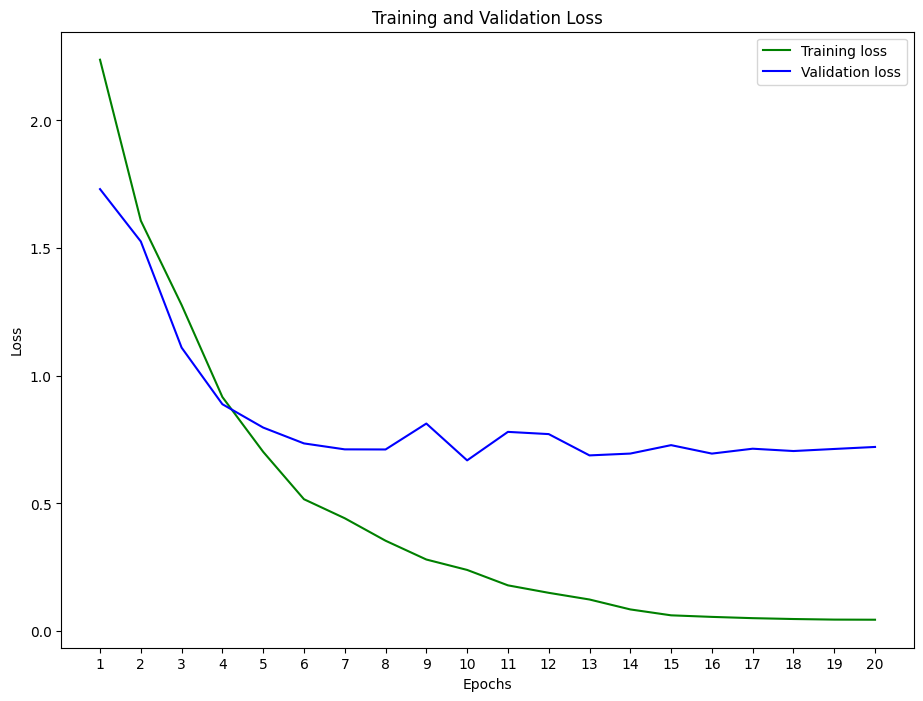

In [39]:

plt.figure(figsize=(11, 8))

loss_train = history.history['loss']
loss_val = history.history['val_loss']
epochs = range(1, len(loss_train) + 1)  # Use the length of loss_train for the range

plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val[:len(epochs)], 'b', label='Validation loss')  # Use loss_val[:len(epochs)] to match the lengths

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xticks(np.arange(1, len(epochs) + 1))
plt.legend()
plt.show()


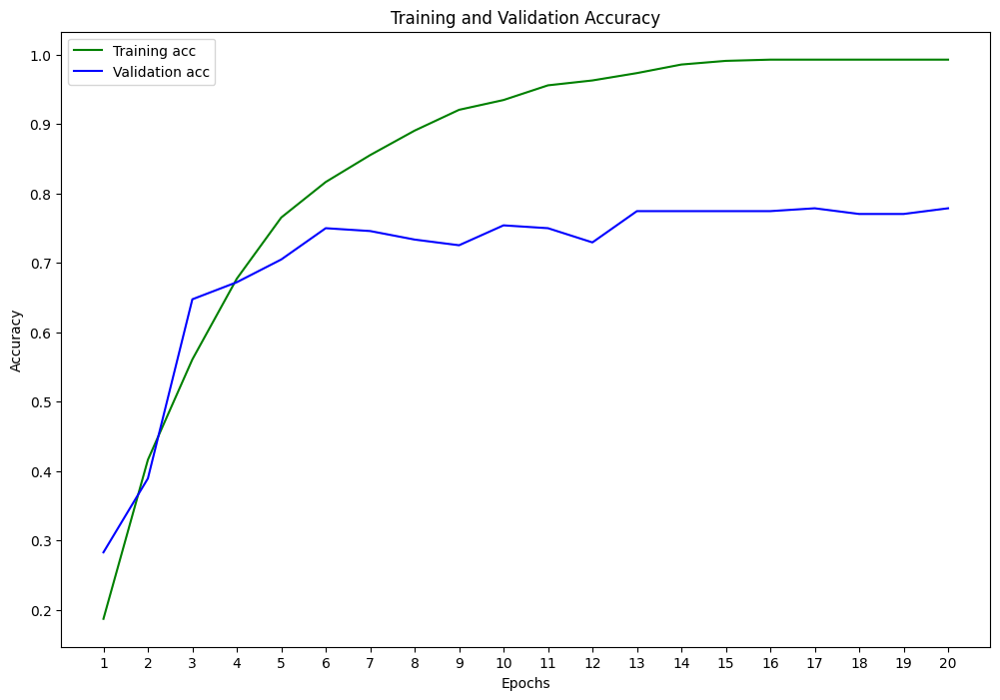

In [40]:

plt.figure(figsize=(12, 8))

acc_train = history.history['acc']
acc_val = history.history['val_acc']
epochs = range(1, len(acc_train) + 1)  # Use the length of acc_train for the range

plt.plot(epochs, acc_train, 'g', label='Training acc')
plt.plot(epochs, acc_val[:len(epochs)], 'b', label='Validation acc')  # Use acc_val[:len(epochs)] to match the lengths

plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xticks(np.arange(1, len(epochs) + 1))
plt.legend()
plt.show()


In [41]:
y_predicted_labels = [np.argmax(i) for i in y_pred]

In [42]:
y_predicted_labels = np.array(y_predicted_labels)
y_predicted_labels.shape

(244,)

In [43]:
y_predicted_labels

array([4, 5, 0, 3, 0, 0, 3, 1, 1, 3, 4, 4, 0, 2, 5, 5, 3, 0, 0, 2, 5, 3,
       0, 3, 3, 5, 4, 5, 0, 4, 1, 0, 1, 2, 3, 2, 5, 5, 2, 4, 0, 4, 0, 3,
       4, 2, 4, 4, 2, 1, 3, 1, 2, 3, 2, 0, 5, 4, 4, 3, 4, 1, 4, 3, 3, 5,
       5, 5, 5, 1, 1, 3, 5, 5, 0, 1, 5, 5, 0, 0, 0, 5, 0, 2, 0, 4, 0, 1,
       5, 2, 4, 1, 4, 1, 3, 2, 3, 4, 4, 2, 4, 3, 2, 4, 3, 2, 5, 3, 3, 3,
       4, 4, 3, 4, 4, 3, 0, 5, 1, 5, 5, 5, 2, 1, 5, 4, 0, 1, 5, 4, 2, 5,
       3, 0, 3, 0, 1, 1, 5, 4, 4, 2, 1, 0, 5, 5, 5, 4, 1, 5, 3, 5, 0, 5,
       1, 1, 1, 5, 0, 0, 1, 1, 0, 5, 5, 0, 4, 4, 2, 1, 2, 2, 0, 0, 4, 0,
       3, 4, 5, 3, 5, 5, 5, 2, 4, 5, 5, 0, 5, 2, 3, 1, 2, 1, 4, 0, 4, 2,
       2, 5, 5, 2, 2, 3, 4, 5, 4, 4, 2, 5, 2, 3, 3, 4, 3, 2, 2, 2, 2, 5,
       1, 5, 3, 1, 1, 5, 5, 5, 5, 5, 1, 5, 5, 4, 2, 0, 2, 2, 4, 5, 4, 3,
       3, 3])

In [46]:
y_test

array([[0, 0, 0, 0, 1, 0],
       [0, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0]])

In [47]:
y_test = np.where(y_test == 'EMPEROR PENGUIN', 4, y_test) 
y_test = np.where(y_test == 'BARN OWL', 1, y_test) 
y_test = np.where(y_test == 'AMERICAN GOLDFINCH', 0, y_test) 
y_test = np.where(y_test == 'DOWNY WOODPECKER', 3, y_test) 
y_test = np.where(y_test == 'FLAMINGO', 5, y_test) 
y_test = np.where(y_test == 'CARMINE BEE-EATER', 2, y_test)
y_test

<ipython-input-47-1bcaa15e3f56>:1: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  y_test = np.where(y_test == 'EMPEROR PENGUIN', 4, y_test)
<ipython-input-47-1bcaa15e3f56>:2: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  y_test = np.where(y_test == 'BARN OWL', 1, y_test)
<ipython-input-47-1bcaa15e3f56>:3: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  y_test = np.where(y_test == 'AMERICAN GOLDFINCH', 0, y_test)
<ipython-input-47-1bcaa15e3f56>:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  y_test = np.where(y_test == 'DOWNY WOODPECKER', 3, y_test)
<ipython-input-47-1bcaa15e3f56>:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the f

array([[0, 0, 0, 0, 1, 0],
       [0, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0]])

In [48]:
y_test = y_test.astype('int32')
y_test

array([[0, 0, 0, 0, 1, 0],
       [0, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0]], dtype=int32)